# Optimizing Feature Selection for Diabetes Prediction Amongst Patients Using Logistic Regression

### Author: Muhammad Shahbaz Murtaza (61140299, Group 29)

In [23]:
# loading the required libraries into R

library(tidyverse)
library(GGally)
library(leaps)
library(rsample)
library(broom)
library(knitr)

## 1. Introduction: 

The [dataset](https://www.kaggle.com/datasets/whenamancodes/predict-diabities/data) which is the main focus of this report originated from the National Institute of Diabetes and Digestive and Kidney Diseases, and was retrieved through Kaggle. 

After reading the data into R, cleaning and wrangling, the dataset contained 768 observations of female patients, aged at least 21 years old, of Pima Indian heritage. Our main variable of interest here is Outcome, which is a binary response, encoded with 0s - meaning the patient does not have diabetes - and 1s - meaning the patient has diabetes. 

The response, along with the eight medical, explanatory predictors, are described below in further detail:

Our Response:

* `Outcome`: Binary, 0 for Not Diabetic/ 1 for Diabetic

Our Explanatory Predictors:

* `Pregnancies`: Numerical, the number of pregnancies the patient has undergone (count of pregnancies)
* `Glucose`: Numerical, the glucose level in the patient's blood (mg/dL)
* `BloodPressure`: Numerical, the blood pressure of the patient (mmHg)
* `SkinThickness`: Numerical, the skin thickness of the patient (mm)
* `Insulin`: Numerical, the insulin level in the patient's blood (IU/mL)
* `BMI`: Numerical, body mass index of the patient (kg/m^2)
* `DiabetesPedigreeFunction`: Numerical, the diabetes percentage of the patient (on a scale from 0 to 1)
* `Age`: Numerical, the age of the patient (years)

#### *Question of Interest: Which features contribute most to the predictive power of a logistic regression model for diabetes prediction?*

## 2. EDA: 

### 2.1: Preliminary Analysis:

In [2]:
# reading the dataset into R 
diabetes_data <- read.csv("diabetes.csv")

In [3]:
# remove all NAs and duplicates from the dataset 
diabetes <- diabetes_data |>
            na.omit() |> 
            distinct() 

head(diabetes)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<int>
1,6,148,72,35,0,33.6,0.627,50,1
2,1,85,66,29,0,26.6,0.351,31,0
3,8,183,64,0,0,23.3,0.672,32,1
4,1,89,66,23,94,28.1,0.167,21,0
5,0,137,40,35,168,43.1,2.288,33,1
6,5,116,74,0,0,25.6,0.201,30,0


In [4]:
# a deeper look into the dataset
str(diabetes)

'data.frame':	768 obs. of  9 variables:
 $ Pregnancies             : int  6 1 8 1 0 5 3 10 2 8 ...
 $ Glucose                 : int  148 85 183 89 137 116 78 115 197 125 ...
 $ BloodPressure           : int  72 66 64 66 40 74 50 0 70 96 ...
 $ SkinThickness           : int  35 29 0 23 35 0 32 0 45 0 ...
 $ Insulin                 : int  0 0 0 94 168 0 88 0 543 0 ...
 $ BMI                     : num  33.6 26.6 23.3 28.1 43.1 25.6 31 35.3 30.5 0 ...
 $ DiabetesPedigreeFunction: num  0.627 0.351 0.672 0.167 2.288 ...
 $ Age                     : int  50 31 32 21 33 30 26 29 53 54 ...
 $ Outcome                 : int  1 0 1 0 1 0 1 0 1 1 ...


The above analysis cleaned the dataset and performed all preliminary analysis required.

### 2.2: Visualizations:

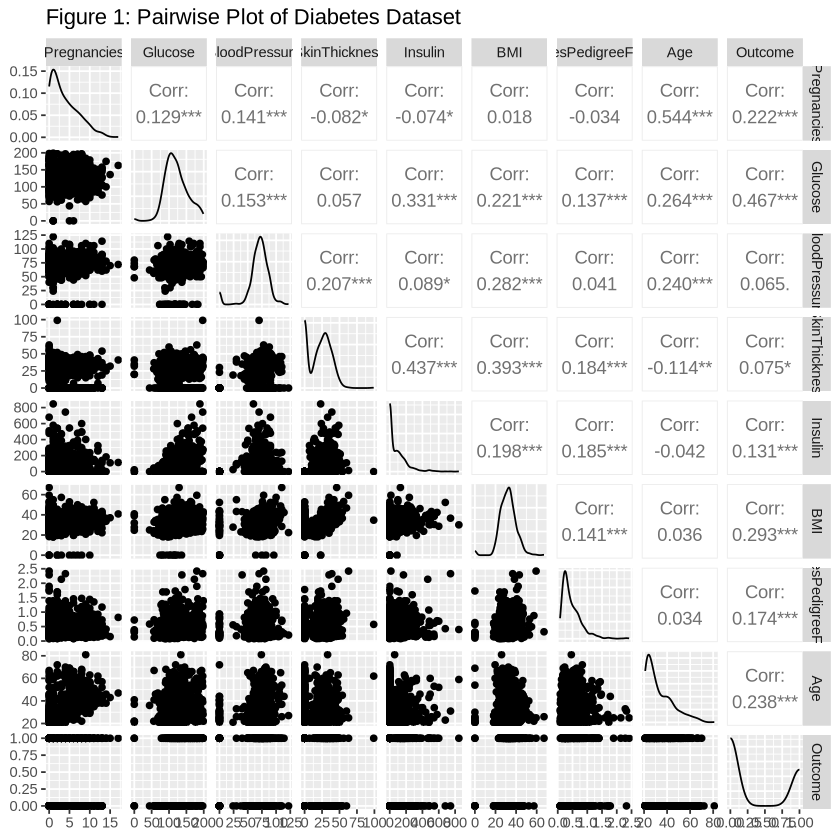

In [5]:
# to check the correlation between our predictors and response
ggpairs(diabetes) + ggtitle("Figure 1: Pairwise Plot of Diabetes Dataset")


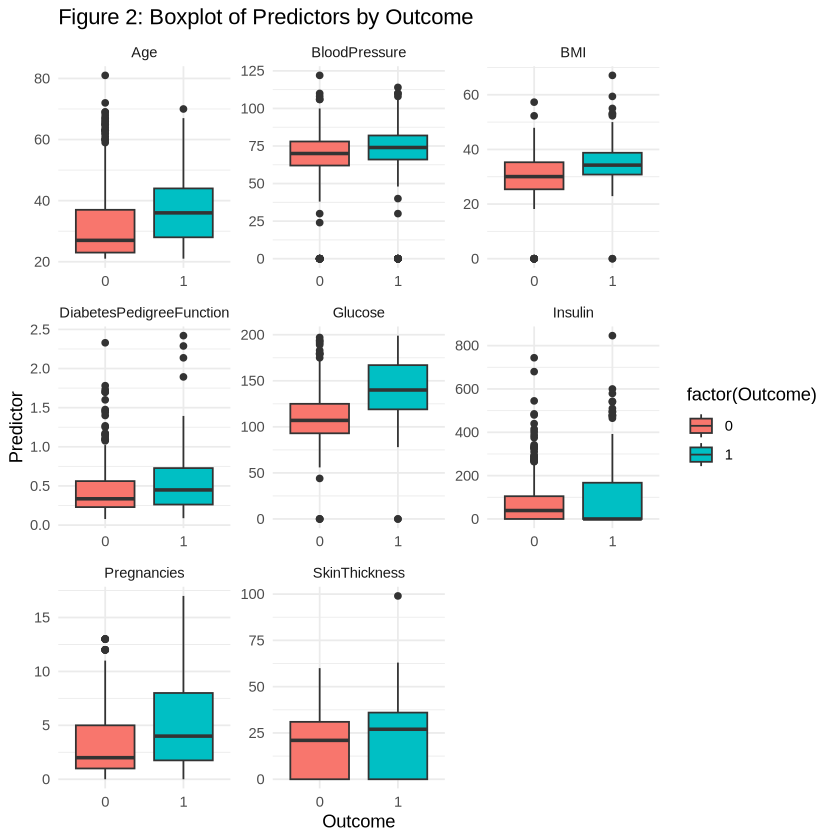

In [6]:
diabetes_for_plot <- gather(diabetes, key = "Predictor", value = "Value", -Outcome)

## facet wrap for all the boxplots above against the response
ggplot(diabetes_for_plot, aes(x = factor(Outcome), y = Value, fill = factor(Outcome))) +
  geom_boxplot() +
  facet_wrap(~ Predictor, scales = "free") +
  labs(title = "Figure 2: Boxplot of Predictors by Outcome", 
       x = "Outcome", y = "Predictor") +
  theme_minimal()

Figure 1 shows the correlations of the predictors amongst each other and with the response. This will be useful later to evaluate multicollinearity since variables with high correlation could be problematic, so such a plot would be essential in further analysis.

Figure 2 demonstrates the boxplots of all the predictors against our response, `Outcome`. These boxplots will be integral in gauging the variability within each predictor and how it varies for the two levels of our response. Is there a lot of variability there which shows a clear difference in observations? Are the distributions of our predictors starkly different for the two levels of our response? Are there any outliers which may have influence and must be removed to stabilize the results of our logistic regression model? All these questions are of importance and will be looked into when the final report is compiled. 

## 3. Outline of the Plan:

For the report, this study will initially leverage a lot of techniques like cross-validation and forward selection to obtain the optimal number of predictors which will build the main logistic model in question. Before going into any analysis, the report will ensure that all assumptions of the logistic regression model are met.

Once that is performed and the predictors are solidified, the plan is to perform model diagnostics to rid the model of any and all issues with multicollinearity, confounding factors and/or heteroscedasticity which might occur within our model. Techniques such as VIF (Variance Inflation Factor), sketching residual plots and QQ plots would be utilized to assist further in the above analysis.

To perform cross-validation and to test the model performance later, the dataset would be split into three for validation, training and testing. Once the model is built using the training set, the report will go into exploring interaction terms within variables and visualize if any such interactions exist. This will boost the model performance and strength the model's predictive power. 

Finally, the model built will then be used to predict on the testing set split before. Metrics such as adjusted r-squared, rmse, AIC and BIC will be evaluated. These will be tabulated for future discussions. 

The report will conclude with a deeper insight into improvements which can be made into the model and how to deal with such deficiencies within the model's performance. It will also delve into what that could mean for the future of healthcare and the contribution of such analysis to the research of modern day medical practices in diabetic detection within patients.

## 4. Implementation of a Proposed Model:

As we mentioned earlier in the plan, we are proposing a prediction model using logistic regression on the training set which will then be evaluated on the testing set using metrics such as AUC-ROC curve. Confusion matrices will be drawn for deeper evaluation. A light pre-selection will be utilized, corroborated by forward selection, to strengthen the predictive power of our model and rid our model of any predictors with missing values.

The predictor, Outcome, is a binary response predicting if a patient has diabetes or not which validates our 
choice of model. 

##### Following are few of the assumptions for our logistic model:
1. Observations in our diabetes dataset are independent of each other.
2. The relationship between the predictors and the log-odds of the outcome must be linear.
3. Predictors must not have perfect correlation (which was proven already above in Figure 1)
4. The dataset should have enough samples per predictor to ensure stable and reliable coefficient estimates.

Though we will not be testing these assumptions in this phase of the deliverable, it is crucial to mention them going forward. Similarly, we will also note a few limitations our devised plan has which may deter the efficiency of an optimal model.

#### Limitations:

1. If the linearity assumption fails, the model will lead to a biased fit and estimates, and ultimately inaccurate predictions.
2. Sensitivity of our model to outliers can disproportionately influence the coefficients. This can be resolved later by using Cook's Distance to investigate observations with high influence.
3. Our model may not deal as well if the relationships between our predictors and response are highly complex, with a lot of interactions. This may make our interpretations not so simple and lead to underperformance.
4. If our dataset has a class imbalance, this may skew our model's predictions and our calculation of diabetes likelihood. However, at the same time, it is to note that the class imbalance also represents the imbalance which exists in real life (i.e more people are likely to not be diagnosed diabetic)



In [7]:
# performed forward selection to reduce the number of variables 
forward_selection <- regsubsets(
    x = Outcome ~ .,
    data = diabetes, 
    method = "forward"
)

summary(forward_selection)

Subset selection object
Call: regsubsets.formula(x = Outcome ~ ., data = diabetes, method = "forward")
8 Variables  (and intercept)
                         Forced in Forced out
Pregnancies                  FALSE      FALSE
Glucose                      FALSE      FALSE
BloodPressure                FALSE      FALSE
SkinThickness                FALSE      FALSE
Insulin                      FALSE      FALSE
BMI                          FALSE      FALSE
DiabetesPedigreeFunction     FALSE      FALSE
Age                          FALSE      FALSE
1 subsets of each size up to 8
Selection Algorithm: forward
         Pregnancies Glucose BloodPressure SkinThickness Insulin BMI
1  ( 1 ) " "         "*"     " "           " "           " "     " "
2  ( 1 ) " "         "*"     " "           " "           " "     "*"
3  ( 1 ) "*"         "*"     " "           " "           " "     "*"
4  ( 1 ) "*"         "*"     " "           " "           " "     "*"
5  ( 1 ) "*"         "*"     "*"           " "   

In [10]:
#for logistic models, adjr2 and bic seem to be the most important metrics
best_model_index_bic <- which.min(summary(forward_selection)$bic)
best_model_index_adjr2 <- which.max(summary(forward_selection)$adjr2)

best_model_vars <- names(coef(forward_selection, best_model_index_bic))[-1]

diabetes_red <- diabetes |>
                select(best_model_vars, Outcome)
head(diabetes_red)

,Pregnancies,Glucose,BloodPressure,BMI,DiabetesPedigreeFunction,Outcome
,<int>,<int>,<int>,<dbl>,<dbl>,<int>
1,6,148,72,33.6,0.627,1
2,1,85,66,26.6,0.351,0
3,8,183,64,23.3,0.672,1
4,1,89,66,28.1,0.167,0
5,0,137,40,43.1,2.288,1
6,5,116,74,25.6,0.201,0


The forward selection algorithm preferred model 5 with BIC and model 7 with adjr2 as the best ones, with dropping `SkinThickness`, `Insulin` and `Age` for the BIC model and just `SkinThickness` for the adjr2 one. However, from Figure 1.2, `Insulin` and `SkinThickness` had their quartiles close to 0, which suggested a lot of NAs in those two columns which raised concerns about their inclusion. Hence, we preferred results from BIC and moved forward accordingly. 

In [20]:
# the model could not have been made without the forward selection before. Hence, I coded for it even if it was not required. 

#for reproducible results
set.seed(1234)

# splitting the data for training and testing
diabetes_split <- 
    diabetes_red %>%
    initial_split(prop = 0.7, strata = Outcome)

training_diabetes <- training(diabetes_split)
testing_diabetes <- testing(diabetes_split)

# training the logisitic model on the training set
log_model_diabetes <- glm(
    formula = Outcome ~ .,
    data = training_diabetes, 
    family = "binomial"
)

summary(log_model_diabetes)


Call:
glm(formula = Outcome ~ ., family = "binomial", data = training_diabetes)

Coefficients:
                          Estimate Std. Error z value Pr(>|z|)    
(Intercept)              -8.201894   0.825361  -9.937  < 2e-16 ***
Pregnancies               0.130726   0.032717   3.996 6.45e-05 ***
Glucose                   0.033606   0.004025   8.349  < 2e-16 ***
BloodPressure            -0.005143   0.006065  -0.848  0.39646    
BMI                       0.083189   0.017374   4.788 1.68e-06 ***
DiabetesPedigreeFunction  0.995585   0.335095   2.971  0.00297 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for binomial family taken to be 1)

    Null deviance: 694.17  on 536  degrees of freedom
Residual deviance: 517.86  on 531  degrees of freedom
AIC: 529.86

Number of Fisher Scoring iterations: 5


In [32]:
# tabluated using tidy
tidy(
    log_model_diabetes,
    exponentiate = TRUE,
    conf.int = TRUE,
)

cat("Table 1: Logistic Model Results for Predicting Diabetes\n")


term,estimate,std.error,statistic,p.value,conf.low,conf.high
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),0.0002741338,0.825361012,-9.9373416,2.863673e-23,5.067692e-05,0.00129493
Pregnancies,1.1396558208,0.032717391,3.9956214,6.452479e-05,1.069623e+00,1.21630217
Glucose,1.0341773518,0.004025424,8.3485079,6.913073e-17,1.026300e+00,1.04265481
BloodPressure,0.9948705353,0.006064712,-0.8479653,3.964573e-01,9.830757e-01,1.00683178
BMI,1.0867468814,0.017374281,4.7880382,1.684196e-06,1.051259e+00,1.12548851
DiabetesPedigreeFunction,2.7063072857,0.335094895,2.9710542,2.967794e-03,1.412885e+00,5.26313819


Table 1: Logistic Model Results for Predicting Diabetes


The results indicate that `Pregnancies`, `Glucose`, `BMI`, and `DiabetesPedigreeFunction` are statistically significant under 5% significance as their p-values are less than 0.05. The odds of diabetes increase by approximately 13.97% for each additional `Pregnancies`, by 3.42% for each unit increase in `Glucose`, by 8.67% for each unit increase in `BMI` and by 170.6% for each unit increase in `DiabetesPedigreeFunction` respectively if we keep the rest of the variables constant. `BloodPressure` is not significant with p-value, 0.396. However, this can still be explored further by drawing qq-plots and residual plots. 

## 4. References:

1. Predict Diabetes from Kaggle: https://www.kaggle.com/datasets/whenamancodes/predict-diabities/data